<a href="https://colab.research.google.com/github/ulugeyik/toucanpi/blob/main/ToucanPiMeetingversions03062022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Update: *26/05/2022* Received AstroPi data from ISS. 
ToucanPi Team: Tom, Gaia, Iris, Mentor: Turgut Durduran

Received AstroPi data from ISS on 26/05/2022.

We took our notes and did the data analysis on Google Collaboratory which is a variation of Jupyter Notebooks for Python.

For our reference, our proposal and codes are available at:
https://github.com/ulugeyik/toucanpi/



### Hypotheses 

The following hypotheses were meant to be verified or refuted with the data we acquired:

---

H1: The sensors on AstroPi - inertial measurement unit, in particular accelerometer, gyroscope - can be utilized to separate different directions of acceleration and identify the strength of the earth’s gravitational pull on the ISS.

---

H2: The distance from the earth’s core is the main determinant for the strength of gravity which we have calculated to be 8.7 cm2/sec. It will not depend on the path of the ISS since the height of the ISS is approximately constant throughout.

---

H3: Similar considerations are true for the magnetic field except that if we end up recording over the South Atlantic anomaly, we will see a strong change in the magnetic field.

---

### Methodology

Our methodology was described as (references kept as in the original document):


"Our main goal is to log data about the position of the ISS [6] and the data from the IMU sensors [7] at regular intervals. Our current plan is average data from one second of measurements and log the mean/median and the standard deviation. This will give us measurements of three axes of acceleration (x,y,z of unknown orientation relative to AstroPi placement), six axis of movement (yaw, pitch, roll, x, y, z relative to AstroPi placement) and three axes of the magnetic field (x, y, z relative to AstroPi placement) strength. In addition to this, we will log a timestamp from the real-time clock. We will experiment with the simulator and the physical AstroPi before preparing the final program in order to fine-tune this information.

There is no on-board sensor to locate the ISS precisely over the earth. Instead, we will use the method described in Ref. [6]. In order to relate these findings to the structures over the earth, for example, a tall mountain may affect the gravitational [11] or magnetic fields, we will also record visible light images from the camera at regular intervals. As described in the risk mitigation procedures, we will also use the images to determine the velocity of the ISS. In order not to be overwhelmed with the amount of information, we will record at about one image/per second. We will replace night-time images which may be dark with estimated images from satellite imagery, e.g. Google Earth, based on position approximation. This will also be fine-tuned before submission.

The data will be logged in csv files [8] and our calculations show that we will be way below the 3Gb limit. One important consideration is to define the resolution for the HQ Camera module so as not to pass this limit. We will use previous data-sets, e.g. Ref. [8], to practice how to analyze and represent the data. Of particular interest will be the evolution of independent axes and vector sums of these parameters over time, representation of them over positions over the earth and either automatic or manual detection of special events, e.g. if a boost [4] occurs.

We plan to utilize Python and associated libraries that are allowed for use on the AstroPi for both the script that will run on the AstroPi and also for analyzing the calculated data. " 

# Analysis
## Step 1: Loading data

The First step is to figure out how to get the data into "Google Collaboratory" notebook. The files should reside remotely.

We tried two options:

Using the "upload option" which turned out to require that the action is taken everytime the notebook is loaded. Since our datafile is large, that was not fun!
Other option was to upload the file on Google Drive and use that. This seems to require an authorization everytime the notebook is loaded which may not be ideal for sharing the notebook.
We will look into the best option.

In [ ]:
# Option 1
# The following part is needed in order to upload a data file.
# It requires that I turn on third part cookies
#solution: https://github.com/googlecolab/colabtools/issues/17
#once it has been uploaded I can comment it out.
#info: https://medium.com/towards-data-science/3-ways-to-load-csv-files-into-colab-7c14fcbdcb92
#from google.colab import files
#uploaded = files.upload()
#for loading data on google collaboratory
#import pandas as pd
#import io
#mydata = pd.read_csv(io.BytesIO(uploaded['toucandata_20220513_201103.csv']),parse_dates={ 'newdate': ['Date/Time'] })

# This options delays us a lot because it seems to require that we keep uploading for every session.

In [ ]:
# Code to read csv file into Colaboratory from google drive:
# The above link seems outdated, updated one is
#https://www.geeksforgeeks.org/ways-to-import-csv-files-in-google-colab/
# If your collaboratory session does not have this library, uncomment the following line
#!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

link='https://drive.google.com/file/d/1P5RZMVeQMj-4LJr1XM0yQOQ6e00SkvzM/view?usp=sharing'
 
# To get the id part of the file
id = link.split("/")[-2]
print (id) # Verify that you have everything after 'd/' 
downloaded = drive.CreateFile({'id':id})
myfilename = 'toucandata_20220513_201103.csv'
downloaded.GetContentFile(myfilename) 


1P5RZMVeQMj-4LJr1XM0yQOQ6e00SkvzM


In [ ]:
#For loading data on google collaboratory using Option 2:
import pandas as pd
mydata = pd.read_csv(myfilename,parse_dates={ 'newdate': ['Date/Time'] })


## Step 2: Tackling Hypothesis 1

*H1: The sensors on AstroPi - inertial measurement unit, in particular accelerometer, gyroscope - can be utilized to separate different directions of acceleration and identify the strength of the earth’s gravitational pull on the ISS.*

The idea here is to plot the sensor data split into the three axis and also as a sum. However, as we have noted in our initial proposal, "[o]ne potential issue is that we have not yet understood whether the vector sum of the acceleration will be near-zero or if all axes will read zero. We have simulated this by dropping a mobile phone while running   “Arduino Science Journal” and recording acceleration. The acceleration on all three axes was near zero.

We have learned all about this by watching the following videos:
* "How Mass and Gravity Work in Space - Classroom Demonstration | ISS Video", [Last Accessed: 03/05/2022]

  https://www.youtube.com/watch?v=Vl6Mrhgum2c
* "Space Station Reboost", [Last Accessed: 03/06/2022]

  https://www.youtube.com/watch?v=sI8ldDyr3G0

  

In [5]:
#for maths,plots and other things
# First used pyplot which is great but less interactive on the online notebook
#import matplotlib.pyplot as plt
#import matplotlib.dates as mdates
#if using plotly, this is more interactive.
import plotly.express as px
import plotly.graph_objs as go
#general
import numpy as np
import math

In [6]:

# Just kept for Reference on how to use pyplot which is what we tried first.
#plot acceleration, acceleration intensity of the axis in Gs.
#this is using pyplot , matplotlib, limited interaction capabilities, specially in Junyper/Collaboratory
#plt.figure()
#plt.plot(mydata.newdate,np.sqrt(np.square(mydata.AccX)+np.square(mydata.AccY)+np.square(mydata.AccZ)))
#locator = mdates.AutoDateLocator()
#formatter = mdates.ConciseDateFormatter(locator)
#plt.gca().xaxis.set_major_locator(locator)
#plt.gca().xaxis.set_major_formatter(formatter)
#plt.show()


In [7]:
#Hack for labels: https://stackoverflow.com/questions/64371174/plotly-how-to-change-variable-label-names-for-the-legend-in-a-plotly-express-li
newnames = {'AccX':'Acceleration X', 'AccY': 'Acceleration Y', 'AccZ': 'Acceleration Z','wide_variable_3': 'Acceleration Total','Lat': 'Latitude', 'Long': 'Longitude'}
fig= go.Figure(px.line(mydata,x='newdate',y=['AccX','AccY','AccZ',np.sqrt(np.square(mydata.AccX)+np.square(mydata.AccY)+np.square(mydata.AccZ))],hover_data=['Lat','Long'],markers=True))
fig.update_layout(title='Acceleration over time',showlegend=True,yaxis_title="Acceleration [G]",legend_title="Data type",xaxis_title="Date/Time",hovermode='x')
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )
fig.show()

#### Impressions

1. "G" is a unit given in the acceleration of gravitaty on earth's surface. In other words, 1 G = 9.81 m/s$^2$.  This is what the "z" axis of the phone accelerometer on earth reads when it is resting on a table. We see here that the acceleration of the ISS is very small. Total acceleration is about 5% of that on the surface of the earth. This is what we have expected might happen. We have observed "*micro-gravity*".

2. We are zooming in to look at whether we have caught any "boosts". We believe we did not observe any boost during this period.

We had foreseen this in our proposal and this was our risk mitigation strategy:

*One potential issue is that we have not yet understood whether the vector sum of the acceleration will be near-zero or if all axes will read zero. We have simulated this by dropping a mobile phone while running   “Arduino Science Journal” and recording acceleration. The acceleration on all three axes was near zero.  Our risk mitigation strategy is to rely on physics [1-4] to solve this problem. By knowing the angular motion of the ISS from the IMU unit and calculating its velocity from the camera images (e.g. as done by Ref [9]), we can figure out the amount of gravitational pull that the ISS had to overcome at this altitude by selecting this particular velocity and if it is consistent with Newtonian physics [10].*

To do this we need to look at the photos. When we looked at the photos, many were cloudy or dark, as we were warned that it could happen. So an automated analysis was not possible.

In order to do that, we need to:
1. Calibrate the size of the photos. In other words, find out how many pixels correspond to 1 km. We will do this by finding some landmarks that we can identify on the photos as well as on Google Maps so we can compare the physical size ($d_{lm}$ [km] Google Maps) to the number of pixels on a photo ($d_{lmimg}$ [pixels]). We can do this multiple times for confirmation. Let's call this $d_{img}$ [km/pixels] where $d_{img}=d_{lm}/d_{lmimg}$. 
2. Then find out how many pixels ($d_{move}$ [pixels]) an easy to identify landmark, ideally a small one, moves between one or more frames. Since we know the time between each frame ($t_f$) and we can calibrate the distance using the above information, we can get the speed ($v_{img}$) as:  $~ v_{img} = d_{move}\times d_{img} / t_f$ [km/s].

We have identified a set of photos with two islands that were clear. A sample is shown below. The part of the timestamp on the files we liked were 215653 and 220142.

Next, to find where we were on the earth, we going to plot the trajectory of ISS when we took our data.

In [8]:
#show location, possibly wrong:
#to plot things on a world map, interactive, may be incorrect.
fig = px.scatter_geo(mydata,lat=mydata.Lat,lon=mydata.Long,hover_data=[mydata.newdate] )
fig.update_layout(title = 'World map', title_x=0.5)
fig.show()

One of the example photos with the distance in pixels measured using opensource tool Gimp is shown below. This gave $d_{lmimg}$ = 218 pixels.

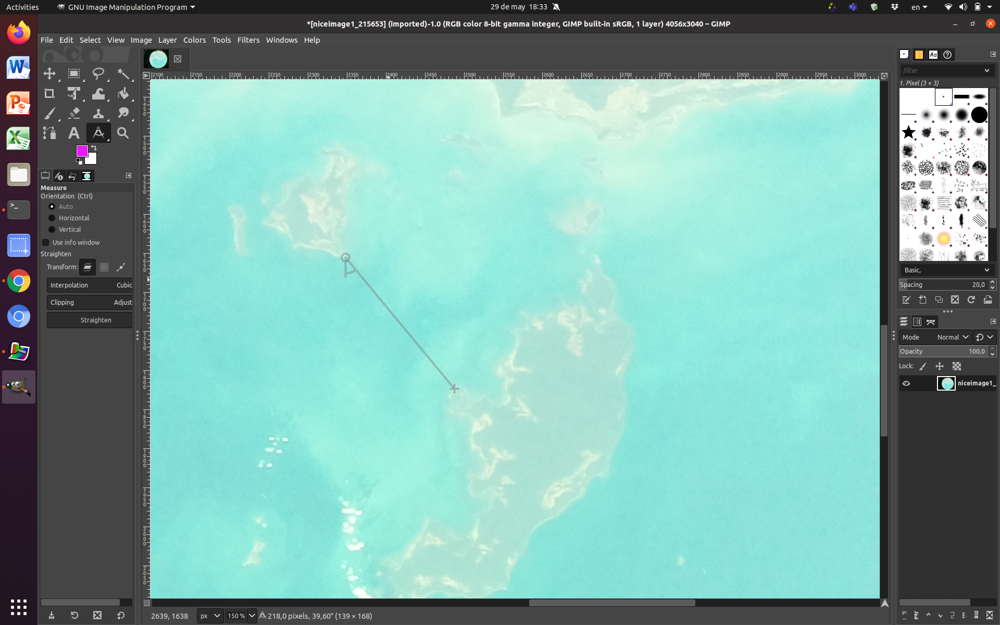

By zooming in and hovering over the points on the above plot of ISS position and time, we can figure out where we were when the photos were taken. The landmarks near Australia were quite obvious. Wellesley Islands are visible in 215653 and surrounding images. Once we got this, we have used Google maps with satellite photo layer turned on.  Below is an image corresponding roughly to the langmarks shown in image "215653" (above) showing $d_{lm} =  30.03$ km. 

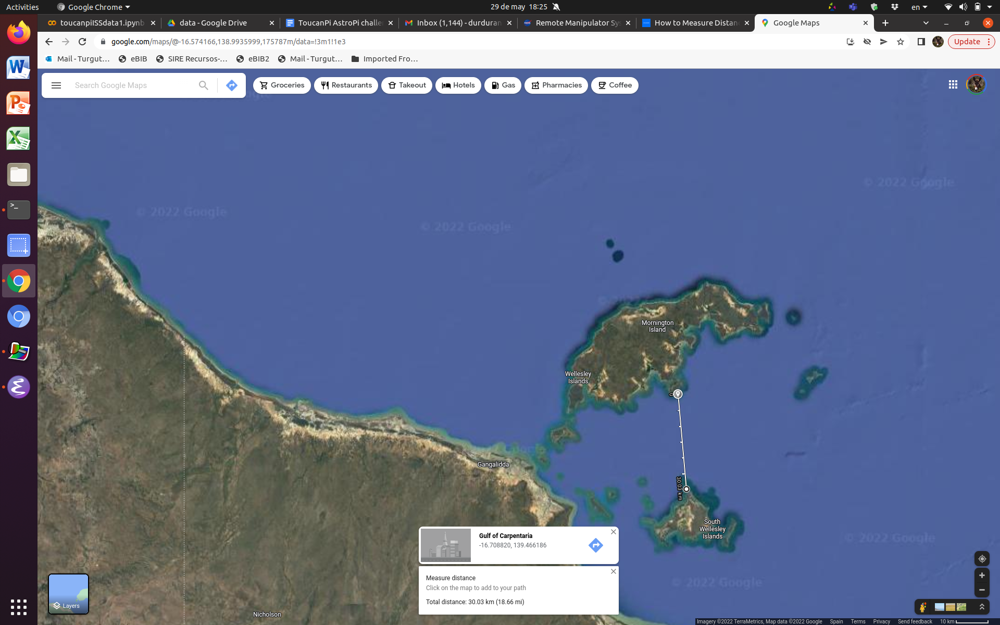

 Now we can calculate the calibration coefficient using $d_{img}$ [km/pixels] where $d_{img}=d_{lm}/d_{lmimg}$. 

In [9]:
#calculate number of kilometers/pixel
calibratedphoto = 30.03/218.0
print("Calibration distance: ", calibratedphoto, "[km/pixel]")

Calibration distance:  0.13775229357798166 [km/pixel]


$d_{img} = 0.138$ [km/pixels] .


We will now find the change in pixels between two photos for several landmarks. This will allow us to measure speed of ISS from photos.

To do this, we loaded photos "215653" and "215626" into Gimp as layers. Then made both desaturated (B&W photo), increased contrast, and was able to clearly see some clouds. Then we made the upper layer semi-transparent using Layers tool (CTRL-L) by sliding the opacity slider. After this, we measured the distance in pixels between two very visible points. This is illustrated below.

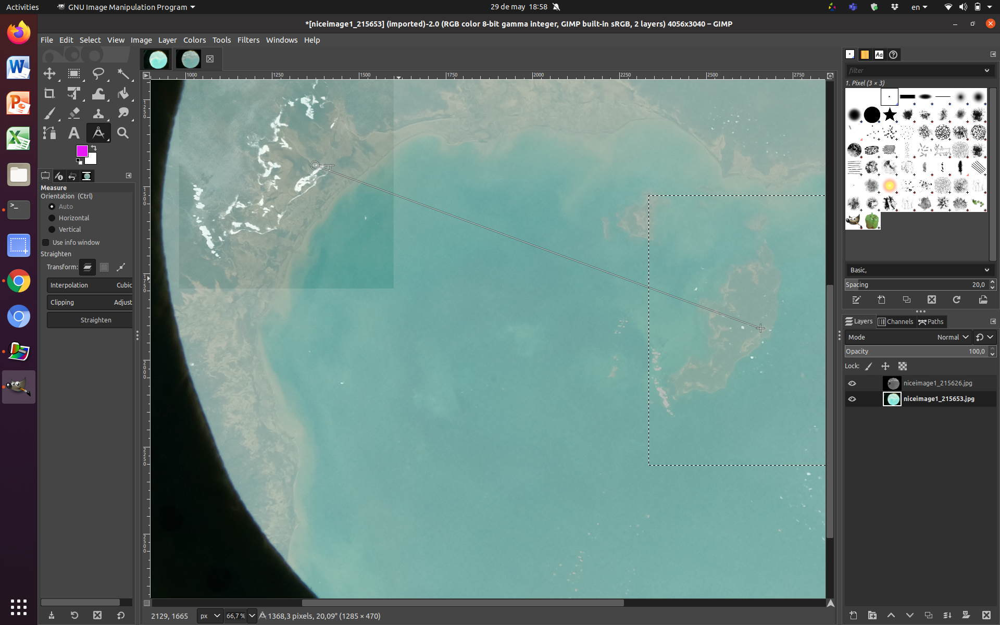

In other words, a small point on this island moved $d_{move}=1368$ pixels in $t_f = 25$ seconds which is the time between frames. This information allows us to calculate the speed of ISS.

In [10]:
#a point in this island moved 1368 pixels in 25 seconds
vimg= 1368/25*calibratedphoto
print("Speed from photo: ", vimg, "[km/s]")

Speed from photo:  7.537805504587157 [km/s]


This gives us $v_{img} = 7.53$ km/s which is very *close* to the true value of 7.66 km/s!

Now that we have estimated the speed of ISS, we can find out its distance from the earth using basic physics. As mentioned in our proposal, we rely on the following reference:
Mathematics of Satellite Motion https://www.physicsclassroom.com/class/circles/Lesson-4/Mathematics-of-Satellite-Motion Last accessed: 30/05/2022

We need a few constants:
* Mass of earth: $M_{earth} = 5.98 \times 10^{24}$ kg 
* Radius of earth: $R_{earth} = 6.37 \times 10^3$ km
* Gravitational constant: $G = 6.673 \times 10^{-20}$ km$^3$/kg/s$^2$.

Furthermore, $R_{total}=R_{ISS} + R_{earth}$ is the total distance of ISS to the center of the earth while $R_{ISS}$ is the height of the ISS from earth's surface.

Given this, the speed of ISS is

 $v_{ISS} = \sqrt{\frac{G M_{earth}}{R_{total}}}$ .

Therefore, 
 $R_{total} = \frac{G M_{earth}}{v_{ISS}^2}$ .

In [11]:
#define constants
Mearth= 5.98e24
Rearth= 6.37e3
G = 6.673e-20

In [12]:
# the distance of ISS to the center of the earth is calculated from photos as
Rimg = G*Mearth/vimg/vimg - Rearth
print("Height of ISS is:", Rimg, "[km]")

Height of ISS is: 653.1582486560374 [km]


The true height is ~400 km.We are quite a bit off here! Off by 253 km. Why?  

It should be our velocity estimate which is 7.53 km/s as opposed to 7.66 km/s. So either our data is bad, or Newton is wrong or we have used the wrong formulas. Let's check the same equation but literature values for velocity. If the result is close to the correct value, then Newton is right, we have used the right formula and the problem is with our velocity calculation.

In [ ]:
Rtrue = G*Mearth/7.66/7.66 - Rearth
print("Height of ISS is:", Rtrue, "[km]")

Height of ISS is: 430.8746395435237 [km]


This gave 430 km which is very close to the true value. We see that a small error in velocity leads to a large error in the estimated height due to the squared velocity. Therefore, it is probably a good idea for us to calculate velocity using different approaches and with multiple images. Good lesson! We learned that small errors in different variables can lead to large errors in final varilables.

Nevertheless, we have enough information that we have either calculated from our data or we know from the literature to find out the true gravitational pull at the ISS. In our proposal, we have promised to use this reference:
https://www.physicsclassroom.com/class/circles/Lesson-3/The-Value-of-g [Last Accessed 30/05/2022] .

We learn from that reference that the value of the acceleration of gravity at the ISS, $g_{ISS}$ is given by 

$g_{ISS} = G M_{earth}/ R_{total}^2$ .

For a check, we can find the known value, $g_{earth}$ at the surface of the earth, 9.81 m/s$^2$. 

In [13]:
gearth= G*Mearth/Rearth/Rearth
print("$g_earth$: ", gearth, "[km/s$^2$]" )

$g_earth$:  0.009834299810976195 [km/s$^2$]


Yes! This is very close to the true value (remember kilometers versus meters!)

Let's do it for ISS now.

In [14]:
gimg = G*Mearth/(Rimg+Rearth)/(Rimg+Rearth)
print("$g_iss$ from photos: ", gimg, "[km/s$^2$]" )

$g_iss$ from photos:  0.008090165394729261 [km/s$^2$]


This gives $g_{ISS} = 0.0081$ km/s$^2$. Let's now find how many G's this is. G=1 is earth.

In [ ]:
print("Gravitational acceleration on ISS in G's: ",gimg/gearth, 'G')

Gravitational acceleration on ISS in G's:  0.8226478295587163 G


This gives $g_{ISS} = 0.0081$ km/s$^2$ = 0.823 G. As expected, if we use the true height, we get a better result but we are not too far off! The literature says 0.89 G.

The gist of the story is that our findings confirm that there is a very strong pull of gravity on the ISS and the ISS has to maintain a proper velocity to match this pull. Otherwise, it will not stay on orbit! 

As a reminder, this means that we can **accept** hypothesis 1 (H1). We can use the sensors and information from the photos to  identify the strength of the earth’s gravitational pull on the ISS!


## Step 3: Tackling Hypothesis 2
*H2: The distance from the earth’s core is the main determinant for the strength of gravity which we have calculated to be 8.7 cm2/sec. It will not depend on the path of the ISS since the height of the ISS is approximately constant throughout.*

This hypothesis is a bit more tricky since we do not have enough photos to utilize to calculate the ISS velocity like we did above using semi-automated methods. 

**Why**?

We have obtained 406 photos. To a quick look at the photos we did an animated gif using linux tools: 

*> ffmpeg -framerate 10 -pattern_type glob -i '*.jpg' -r 15 -vf scale=512:-1 out.gif* 

This animated gif is available at

https://twitter.com/ulugeyik/status/1529869207365734401?s=20&t=AmuwJdfgKzElUFMn65n3aw

Our observations are: 

1. land is not visible in most photos, 
2. perhaps lower resolution but more frequent photos would have been useful, 
3. a part of ISS is visible in our photos. 

The part of ISS was identified to us by an email from the AstroPi team
"[w]e thought you might like to know that during team Toucan Pi's experiment, Canadarm 2 crossed the window of the ISS. ESA have let us know that this occurred on 73 of 406 images. I hope this does not affect your analysis. You are one of only two teams that captured this during the challenge this year!"

Very cool!

**Alternative, simplified plan**

So we can not do a thorough analysis for the whole flight but we can do an estimate. We are learning the importance of rough estimates here!

We have calculated the distance using the calculated velocity. We can calculate velocity using the recorded position and the frequency with which we have recorded the data. We have time stamps in the file and also we know the programmed frequency (every 5 seconds).


In [106]:
#to get speed of ISS from our location and time data
import geopy.distance #this allows calculation of distance from latitude and longitude
distance = np.empty([len(mydata)-1])
#speed = np.empty([len(mydata)-1,1]) #fudge this for easy plotting
speed = np.empty([len(mydata)])
duration = np.empty([len(mydata)-1])
for i in range(len(mydata)-1):
  distance[i]=geopy.distance.geodesic((mydata.Lat[i],mydata.Long[i]),(mydata.Lat[i+1],mydata.Long[i+1])).km
  tmp=mydata.newdate[i+1]-mydata.newdate[i]
  duration[i]=tmp.total_seconds()
  speed[i]=distance[i]/duration[i]
  #print(speed[i])

speed[i+1]=speed[i] #fake for easy plotting.
print('Mean speed:', np.mean(speed),'km/s', '  Mean duration:', np.mean(duration),'s', '  Mean distance:', np.mean(distance),'km')
print('Literature 7.66 km/s')
#Alternatives , e.g. if duration is mistaken due to file writing, our goal was 5 seconds
print('Mean speed (alt):', np.mean(distance)/5,'km/s')



Mean speed: 6.89868385505622 km/s   Mean duration: 5.271334642681124 s   Mean distance: 36.3656219409018 km
Literature 7.66 km/s
Mean speed (alt): 7.273124388180359 km/s


The mean speed 6.9 km/s is quite off but this is probably due to the time it took to write the data to the file which is given by the mean duration between time-stamps, 5.27 s. So we did an alternative calculation with the 5 s assumption and obtained 7.27 km/s which is quite close to the literature value. As we know, we cannot use this information to get an accurate esimate of the gravitational pull around the flight path but we can look at how it is varying point-to-point in a proportional manner.


In [61]:
#Let's plot the speed versus time and along side latitude and longitude
newnames = {'wide_variable_0': 'Estimated speed','wide_variable_1' : "Latitude", 'wide_variable_2' : "Longitude"}
fig= go.Figure(px.line(mydata,x='newdate',y=[speed/np.mean(speed)-1, mydata.Lat/10000, mydata.Long/10000],markers=True))
fig.update_layout(title='Estimated speed & Position over time',showlegend=True,yaxis_title="$\\text{Normalized speed & position} [AU]$",legend_title="Data type",xaxis_title="Date/Time",hovermode='x')
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )
fig.show()

We had to struggle with this plot since the changes in speed were very very small and we were having trouble fixing the plot axes. So we have normalized the speed to be around zero and divided latitude/longitude values by 10000.

In [65]:
#show location on map:
fig = px.scatter_geo(mydata,lat=mydata.Lat,lon=mydata.Long,color=speed,hover_data=[mydata.newdate])
fig.update_layout(title = 'ISS trajectory over world map & estimated speed', title_x=0.5,coloraxis_colorbar=dict(title="Estimated Speed [km/s]"))
fig.show()


Cool results. We understand that the speed and, therefore, according to this rough estimation the distance of ISS from the center of the earth is varying with position and most strongly with lattitude. This makes sense since the earth is not a perfect sphere and it bulges at its center. In the future, we can calculate the distance of the ISS from the surface of the earth even! For future.

Hypothesis 2 (H2) can be partially *rejected* since the answer is not a constant. We said partially since the changes are very small and they are within our *"experimental accuracy"*. It should have been symmetric around the equator but ourmap is not great.. A new concept that we have learned!

We can learn from this web-site:
https://www.physicsforums.com/insights/all-about-earths-gravity/

## Step 4: Tackling Hypothesis 3

*H3: Similar considerations are true for the magnetic field except that if we end up recording over the South Atlantic anomaly, we will see a strong change in the magnetic field.*

The analysis for this hypothesis is relatively simple. We will plot the measured magnetic fields in couple of different ways and show our observations.


In [62]:
newnames = {'MagnetX':'Magnetic F. X', 'MagnetY':'Magnetic F. Y','MagnetZ':'Magnetic F. Z','wide_variable_3': 'Magnetic F Total','Lat': 'Latitude', 'Long': 'Longitude'}
fig= go.Figure(px.line(mydata,x='newdate',y=['MagnetX','MagnetY','MagnetZ',np.sqrt(np.square(mydata.MagnetX)+np.square(mydata.MagnetY)+np.square(mydata.MagnetZ))],hover_data=['Lat','Long'],markers=True))
fig.update_layout(title='Magnetic Field over time',showlegend=True,yaxis_title="$\\text{Magnetic Field} [\mu T]$",legend_title="Data type",xaxis_title="Date/Time",hovermode='x')
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )
fig.show()

This plot of the different components and the total magnetic field revealed significant changes with position. So let's overlay it with the position.

In [63]:
#is there a latitude/longitude dependence here?
newnames = {'MagnetX':'Magnetic F. X', 'MagnetY':'Magnetic F. Y','MagnetZ':'Magnetic F. Z','wide_variable_3': 'Magnetic F Total','Lat': 'Latitude', 'Long': 'Longitude'}
fig= go.Figure(px.line(mydata,x='newdate',y=['MagnetX','MagnetY','MagnetZ',np.sqrt(np.square(mydata.MagnetX)+np.square(mydata.MagnetY)+np.square(mydata.MagnetZ)),'Lat','Long'],markers=True))
fig.update_layout(title='Magnetic Field & Position over time',showlegend=True,yaxis_title="$\\text{Magnetic Field} [\mu T]$",legend_title="Data type",xaxis_title="Date/Time",hovermode='x')
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )
fig.show()

In [64]:
#show location on map:
fig = px.scatter_geo(mydata,lat=mydata.Lat,lon=mydata.Long,color=mydata.MagnetZ,hover_data=[mydata.newdate])
fig.update_layout(title = 'ISS trajectory over world map & total magnetic field', title_x=0.5,coloraxis_colorbar=dict(title="Magnetic Field [uT]"))
fig.show()

Interesting. It is similar to the velocity and it seems to depend a lot on the latitude but on both. Perhaps because the earth is fatter at certain positions. It looks like gravity.

We found a map of it here:
http://www.geomag.bgs.ac.uk/education/earthmag.html

In conclusion, we *accept* hypothesis 3 (H3).

## Step 5: Looking at other details of the data

**Orientation**

ISS must be spinning as it goes around the earth. Can we see that? We have data. Let's plot the orientation data.

In [67]:
#plot orientation data
tmp={'newdate': mydata.newdate, 'OrientPitch': mydata.OrientPitch*180.0 / math.pi, 'OrientRoll': mydata.OrientRoll*180.0 / math.pi,'OrientYaw': mydata.OrientYaw*180.0 / math.pi, 'Lat': mydata.Lat, 'Long': mydata.Long}
tmpdf = pd.DataFrame(data=tmp)
newnames = {'OrientPitch':'Pitch', 'OrientRoll':'Roll','OrientYaw':'Yaw','Lat': 'Latitude', 'Long': 'Longitude'}
fig= go.Figure(px.line(tmpdf,x='newdate',y=['OrientPitch','OrientRoll','OrientYaw'],hover_data=['Lat','Long'],markers=True))
fig.update_layout(title='Orientation over time',showlegend=True,yaxis_title="Orientation [$^o$]",legend_title="Data type",xaxis_title="Date/Time",hovermode='x')
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )
fig.show()

Yes it does! Specially "yaw" which is how an aeroplane would be making turns without spinning! Let's plot it on the early like we did with the other data but plot its absolute value.

We can play with this here:
https://compsci290-s2016.github.io/CoursePage/Materials/EulerAnglesViz/

In [110]:
#show location on map:
fig = px.scatter_geo(mydata,lat=mydata.Lat,lon=mydata.Long,color=np.abs(mydata.OrientYaw*180/math.pi),hover_data=[mydata.newdate])
fig.update_layout(title = 'ISS trajectory over world map & Yaw', title_x=0.5,coloraxis_colorbar=dict(title="Yaw"))
fig.show()

Orientation depends both on latitude and longitude. 

But we knew this since photos of ISS taken from earth show that its face that looks at the earth changes with time!

**Todo:** Try to plot this as a spinning object in the future around the earth. It should be fun.

We can do many things with our data. We will continue to work on it during summer. For example:

1. Do something interesting with the CanadaArm2 photos. We can try to calculate its size, how fast it moves etc.
2. We learn how to animate a satellite with this information.
3. Spend more time looking into details in the plots.


This part is something we are playing with but does not work yet. It is based on
https://chart-studio.plotly.com/~empet/15666/roll-pitch-and-yaw-motion-of-an-airplan/#/

But fails at the last step. We wanted to animate an aeroplane based on Yaw.

In [80]:
#!pip install meshio
import meshio
from numpy import pi, cos, sin, sqrt

def rotx(t):
    return np.array([[1, 0, 0], [0, cos(t), -sin(t)], [0, sin(t), cos(t)]])

def roty(t):
    return np.array([[cos(t), 0, sin(t)],  [0, 1, 0],[-sin(t), 0, cos(t)]])   
    
def rotz(t):
    return np.array([[cos(t), -sin(t), 0], [sin(t), cos(t), 0], [0, 0, 1]])
from urllib.request import urlopen
url = 'http://people.sc.fsu.edu/~jburkardt/data/ply/airplane.ply'
data = urlopen(url)

In [81]:


mesh = meshio.read(data, file_format='ply')  
points = rotz(5*pi/6).dot(mesh.points.T)
points.shape
from  IPython.display import Image
Image(url='https://raw.githubusercontent.com/empet/Datasets/master/Images/plane-1.png')
D = np.array([-1283.45876179,  -431.01578484,    63])
x0, y0, z0 = D
u1 = np.array([sqrt(3)/2, -0.5, 0 ])
u2 = np.array([0.5, sqrt(3)/2, 0])
u3 = np.cross(u1, u2)
A = np.array([u1,u2,u3]) #T_{B'B}   B'=(u1, u2, u3), A is the matrix of transition from 
                         #the orthonormal basis, B', to the standard basis in the 3d space
A


array([[ 0.8660254, -0.5      ,  0.       ],
       [ 0.5      ,  0.8660254,  0.       ],
       [-0.       ,  0.       ,  1.       ]])

In [82]:
def rotate(points, D, A,  phi, rot=rotz):
    #points - array of shape (n, 3); they give the initial position of the airplane points
    #D - aray of shape (3,), the origin of the linear frae tied to the airplane; D was defined aboeve
    # A - array of shape (3, 3);  A = np.array([u1,u2,u3])
    # phi - the angle of rotation in radians
    # rot - one of the functions rotx, roty, rotz that returns  the rotation matrix of angle phi;
    # rotx, roty, roz define respectively: the roll, pitch and yaw motion
    
    points_n = np.dot(A, (points-D).T) # express the airplane points with respect to the linear frame (D; u1, u2, u3)
    p_rotated = rot(phi).dot(points_n) #airplane points rotated and expressed with respect to (D; u1, u2, u3)
    return ((A.T).dot(p_rotated)).T  + D   # returns rotated points of shape (n, 3)) and of coords 
                                           # with respect to the standard linear frame (O; i, j, k)
   


In [107]:
x, y, z = points
I, J, K = mesh.cells[0].data.T
gr= [[0, 'rgb(150, 150, 150)'], 
     [1, 'rgb(150, 150, 150)']]
fig = go.Figure(go.Mesh3d(
            x=x,
            y=y, 
            z=z, 
            i=I, 
            j=J, 
            k=K, 
            colorscale=gr,
            showscale=False,
            intensity=z,
            lighting=dict(ambient=0.5,
                          diffuse=1,
                          fresnel=4,        
                          specular=0.5,
                          roughness=0.5),
            lightposition=dict(x=100,
                               y=100,
                               z=1000
            )))


fig.update_layout(title_text='', title_x=0.5, title_y=0.8, 
                  width=800, height=800,scene_aspectmode='data', 
                  scene_xaxis_visible=False,  scene_yaxis_visible=False,
                  scene_zaxis_visible=False,
                  scene_camera_eye=dict(x=1.35,y=1.35, z=0.5));


In [108]:
frames=[]
mylist = range(0,len(mydata.OrientYaw),100)
for k in range(len(mylist)):
    x, y, z = rotate(points.T, D, A,  mydata.OrientYaw[k]*180/math.pi, rot=rotz).T
    frames.append(go.Frame(data=[go.Mesh3d(x=x,y=y,z=z)],
                           layout=dict(title_text='Yaw motion'),
                           traces=[0]))

print(k)

20


In [109]:
fig.update_layout(updatemenus=[dict(type='buttons',
                                  showactive=False,
                                  y=0.1,
                                  x=1.05,
                                  xanchor='left',
                                  yanchor='top',
                                  #pad=dict(t=1),
                                  buttons=[dict(label='Play',
                                                method='animate',
                                                args=[None, dict(frame=dict(duration=50, redraw=True), 
                                                                 transition_duration=0,
                                                                 fromcurrent=True,
                                                                 mode='immediate'
                                                                 )])
                                          ]
                                  )])   
fig.update(frames=frames);


In [105]:
#!pip install chart-studio 

import chart_studio.plotly as pyc
pyc.iplot(fig, filename='yaw-roll-motion')

#this part fails. Let me try something simpler.
#fig.show()

PlotlyRequestError: ignored